In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile

!pip install plotly
import plotly.express as px

!pip install dataprep
from dataprep.eda import create_report

!pip install h2o
import h2o
from h2o.automl import H2OAutoML

In [3]:
#read data
cancer_df = pd.read_csv("cervical_cancer.csv")

In [4]:
#preview
cancer_df.head(10)

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs: Time since first diagnosis,STDs: Time since last diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,18,4.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
1,15,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
2,34,1.0,?,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
3,52,5.0,16.0,4.0,1.0,37.0,37.0,1.0,3.0,0.0,...,?,?,1,0,1,0,0,0,0,0
4,46,3.0,21.0,4.0,0.0,0.0,0.0,1.0,15.0,0.0,...,?,?,0,0,0,0,0,0,0,0
5,42,3.0,23.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
6,51,3.0,17.0,6.0,1.0,34.0,3.4,0.0,0.0,1.0,...,?,?,0,0,0,0,1,1,0,1
7,26,1.0,26.0,3.0,0.0,0.0,0.0,1.0,2.0,1.0,...,?,?,0,0,0,0,0,0,0,0
8,45,1.0,20.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,1,0,1,1,0,0,0,0
9,44,3.0,15.0,?,1.0,1.266972909,2.8,0.0,0.0,?,...,?,?,0,0,0,0,0,0,0,0


# Exploratory Data Analysis

In [5]:
#info
cancer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 858 entries, 0 to 857
Data columns (total 36 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   Age                                 858 non-null    int64 
 1   Number of sexual partners           858 non-null    object
 2   First sexual intercourse            858 non-null    object
 3   Num of pregnancies                  858 non-null    object
 4   Smokes                              858 non-null    object
 5   Smokes (years)                      858 non-null    object
 6   Smokes (packs/year)                 858 non-null    object
 7   Hormonal Contraceptives             858 non-null    object
 8   Hormonal Contraceptives (years)     858 non-null    object
 9   IUD                                 858 non-null    object
 10  IUD (years)                         858 non-null    object
 11  STDs                                858 non-null    object

In [6]:
#statistics
cancer_df.describe()

,Age,STDs: Number of diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
count,858.000000,858.000000,858.000000,858.000000,858.000000,858.000000,858.000000,858.000000,858.000000,858.000000
mean,26.820513,0.087413,0.020979,0.010490,0.020979,0.027972,0.040793,0.086247,0.051282,0.064103
std,8.497948,0.302545,0.143398,0.101939,0.143398,0.164989,0.197925,0.280892,0.220701,0.245078
min,13.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,84.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [7]:
#replace '?' with NaN
cancer_df = cancer_df.replace('?', np.nan)
cancer_df

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs: Time since first diagnosis,STDs: Time since last diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,18,4.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
1,15,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
2,34,1.0,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
3,52,5.0,16.0,4.0,1.0,37.0,37.0,1.0,3.0,0.0,...,NaN,NaN,1,0,1,0,0,0,0,0
4,46,3.0,21.0,4.0,0.0,0.0,0.0,1.0,15.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
853,34,3.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
854,32,2.0,19.0,1.0,0.0,0.0,0.0,1.0,8.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
855,25,2.0,17.0,0.0,0.0,0.0,0.0,1.0,0.08,0.0,...,NaN,NaN,0,0,0,0,0,0,1,0
856,33,2.0,24.0,2.0,0.0,0.0,0.0,1.0,0.08,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0


In [8]:
#look at null
cancer_df.isnull().sum()

,0
Age,0
Number of sexual partners,26
First sexual intercourse,7
Num of pregnancies,56
Smokes,13
Smokes (years),13
Smokes (packs/year),13
Hormonal Contraceptives,108
Hormonal Contraceptives (years),108
IUD,117


<Axes: >

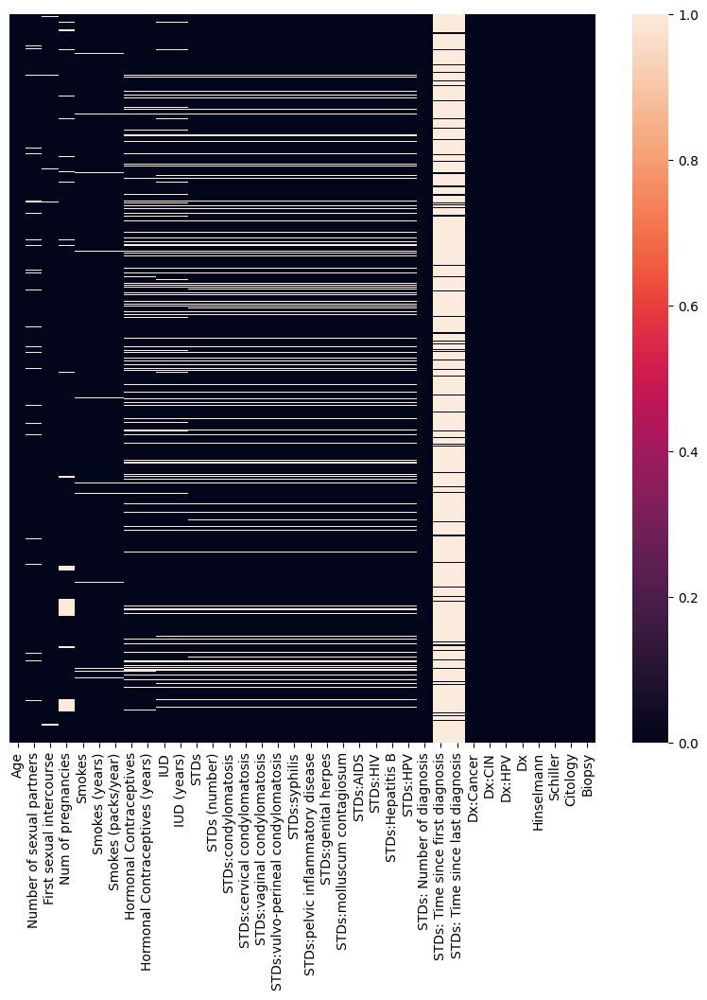

In [9]:
#plot heatmap for all locations that have null values
plt.figure(figsize = (10, 10))
sns.heatmap(cancer_df.isnull(), yticklabels=False)

In [10]:
#since STDs: Time since first diagnosis  and STDs: Time since last diagnosis have more than 80% missing values
# Dx:Cancer raises concerns about the validity of the predictions
#So, we can drop them
cancer_df = cancer_df.drop(columns=['STDs: Time since first diagnosis', 'STDs: Time since last diagnosis','Dx:Cancer'], axis=1)
cancer_df.head()

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs:Hepatitis B,STDs:HPV,STDs: Number of diagnosis,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,18,4.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0,0,0,0,0,0,0,0
1,15,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0,0,0,0,0,0,0,0
2,34,1.0,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0,0,0,0,0,0,0,0
3,52,5.0,16.0,4.0,1.0,37.0,37.0,1.0,3.0,0.0,...,0.0,0.0,0,0,1,0,0,0,0,0
4,46,3.0,21.0,4.0,0.0,0.0,0.0,1.0,15.0,0.0,...,0.0,0.0,0,0,0,0,0,0,0,0


In [11]:
cancer_df = cancer_df.drop(columns=['Hinselmann', 'Schiller', 'Citology'], axis=1)
cancer_df.head()

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs:molluscum contagiosum,STDs:AIDS,STDs:HIV,STDs:Hepatitis B,STDs:HPV,STDs: Number of diagnosis,Dx:CIN,Dx:HPV,Dx,Biopsy
0,18,4.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0
1,15,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0
2,34,1.0,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0
3,52,5.0,16.0,4.0,1.0,37.0,37.0,1.0,3.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0
4,46,3.0,21.0,4.0,0.0,0.0,0.0,1.0,15.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0


In [12]:
cancer_df = cancer_df.apply(pd.to_numeric)
cancer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 858 entries, 0 to 857
Data columns (total 30 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Age                                 858 non-null    int64  
 1   Number of sexual partners           832 non-null    float64
 2   First sexual intercourse            851 non-null    float64
 3   Num of pregnancies                  802 non-null    float64
 4   Smokes                              845 non-null    float64
 5   Smokes (years)                      845 non-null    float64
 6   Smokes (packs/year)                 845 non-null    float64
 7   Hormonal Contraceptives             750 non-null    float64
 8   Hormonal Contraceptives (years)     750 non-null    float64
 9   IUD                                 741 non-null    float64
 10  IUD (years)                         741 non-null    float64
 11  STDs                                753 non-n

In [13]:
cancer_df.describe()

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs:molluscum contagiosum,STDs:AIDS,STDs:HIV,STDs:Hepatitis B,STDs:HPV,STDs: Number of diagnosis,Dx:CIN,Dx:HPV,Dx,Biopsy
count,858.000000,832.000000,851.000000,802.000000,845.000000,845.000000,845.000000,750.000000,750.000000,741.000000,...,753.000000,753.0,753.000000,753.000000,753.000000,858.000000,858.000000,858.000000,858.000000,858.000000
mean,26.820513,2.527644,16.995300,2.275561,0.145562,1.219721,0.453144,0.641333,2.256419,0.112011,...,0.001328,0.0,0.023904,0.001328,0.002656,0.087413,0.010490,0.020979,0.027972,0.064103
std,8.497948,1.667760,2.803355,1.447414,0.352876,4.089017,2.226610,0.479929,3.764254,0.315593,...,0.036442,0.0,0.152853,0.036442,0.051503,0.302545,0.101939,0.143398,0.164989,0.245078
min,13.000000,1.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,20.000000,2.000000,15.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,25.000000,2.000000,17.000000,2.000000,0.000000,0.000000,0.000000,1.000000,0.500000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,32.000000,3.000000,18.000000,3.000000,0.000000,0.000000,0.000000,1.000000,3.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,84.000000,28.000000,32.000000,11.000000,1.000000,37.000000,37.000000,1.000000,30.000000,1.000000,...,1.000000,0.0,1.000000,1.000000,1.000000,3.000000,1.000000,1.000000,1.000000,1.000000


In [14]:
cancer_df.mean()

,0
Age,26.820513
Number of sexual partners,2.527644
First sexual intercourse,16.995300
Num of pregnancies,2.275561
Smokes,0.145562
Smokes (years),1.219721
Smokes (packs/year),0.453144
Hormonal Contraceptives,0.641333
Hormonal Contraceptives (years),2.256419
IUD,0.112011


In [15]:
cancer_df = cancer_df.fillna(round(cancer_df.mean()))
cancer_df.head()

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs:molluscum contagiosum,STDs:AIDS,STDs:HIV,STDs:Hepatitis B,STDs:HPV,STDs: Number of diagnosis,Dx:CIN,Dx:HPV,Dx,Biopsy
0,18,4.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0
1,15,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0
2,34,1.0,17.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0
3,52,5.0,16.0,4.0,1.0,37.0,37.0,1.0,3.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0
4,46,3.0,21.0,4.0,0.0,0.0,0.0,1.0,15.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0


# Data Visualization

In [16]:
corr = cancer_df.corr()
corr

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs:molluscum contagiosum,STDs:AIDS,STDs:HIV,STDs:Hepatitis B,STDs:HPV,STDs: Number of diagnosis,Dx:CIN,Dx:HPV,Dx,Biopsy
Age,1.000000,0.083715,0.369175,0.525892,0.057204,0.217535,0.131861,0.029201,0.280327,0.279429,...,0.000722,NaN,0.005009,-0.027433,0.040861,-0.001606,0.061443,0.101722,0.092635,0.055956
Number of sexual partners,0.083715,1.000000,-0.149418,0.079136,0.233433,0.175895,0.172519,0.007318,0.017367,0.026435,...,0.030308,NaN,0.021007,-0.011266,0.013473,0.050086,0.014775,0.025956,0.021476,-0.002339
First sexual intercourse,0.369175,-0.149418,1.000000,-0.056374,-0.123280,-0.058342,-0.056232,-0.009232,0.010535,-0.010758,...,-0.012185,NaN,-0.008499,0.012299,0.034728,-0.013331,-0.032628,0.043964,0.035748,0.007259
Num of pregnancies,0.525892,0.079136,-0.056374,1.000000,0.081517,0.175054,0.096976,0.118938,0.211139,0.204501,...,0.042509,NaN,0.013729,-0.030681,-0.026153,0.034912,-0.002600,0.048578,0.014227,0.040215
Smokes,0.057204,0.233433,-0.123280,0.081517,1.000000,0.722516,0.493843,0.004036,0.044690,-0.055115,...,-0.013974,NaN,0.056151,0.083503,0.049193,0.090725,-0.042119,0.009737,-0.069396,0.028724
Smokes (years),0.217535,0.175895,-0.058342,0.175054,0.722516,1.000000,0.724038,-0.014469,0.049399,0.028232,...,-0.010245,NaN,0.090447,0.099250,0.051054,0.081076,-0.030881,0.056893,-0.049136,0.061440
Smokes (packs/year),0.131861,0.172519,-0.056232,0.096976,0.493843,0.724038,1.000000,0.001713,0.041045,0.008226,...,-0.006901,NaN,0.053995,0.101342,-0.008015,0.029912,-0.020800,0.109118,-0.034270,0.024487
Hormonal Contraceptives,0.029201,0.007318,-0.009232,0.118938,0.004036,-0.014469,0.001713,1.000000,0.427246,0.000188,...,-0.050547,NaN,-0.076371,-0.050547,0.032666,-0.062199,-0.004397,0.028808,-0.007245,-0.018015
Hormonal Contraceptives (years),0.280327,0.017367,0.010535,0.211139,0.044690,0.049399,0.041045,0.427246,1.000000,0.094589,...,-0.021596,NaN,-0.037066,-0.021596,0.051879,-0.035960,0.003196,0.062126,-0.012335,0.081373
IUD,0.279429,0.026435,-0.010758,0.204501,-0.055115,0.028232,0.008226,0.000188,0.094589,1.000000,...,-0.011179,NaN,0.007118,-0.011179,-0.015819,0.035791,0.043708,0.062142,0.135778,0.059231


Computing sf-92e35067-20e5-45eb-9131-8f3b444bc039:  85%|████████▍ | 2993/3540 [00:02<00:00, 916.82it/s]  /usr/local/lib/python3.10/dist-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


My Report
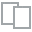
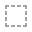
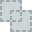
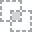
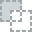
...
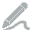
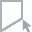
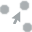
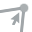
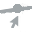

In [17]:
report = create_report(cancer_df, title='My Report')
report

<Axes: xlabel='Age', ylabel='count'>

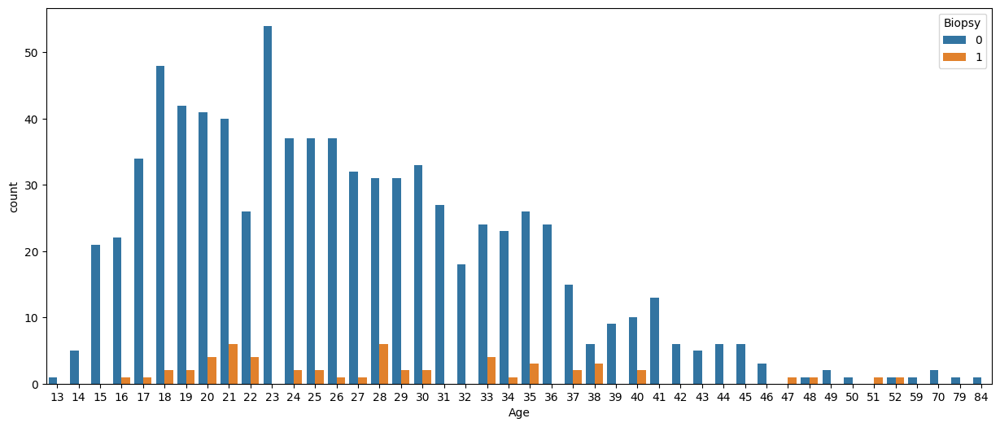

In [18]:
plt.figure(figsize=(15, 6))
sns.countplot(x=cancer_df['Age'],
              hue=cancer_df['Biopsy'])

<Axes: xlabel='Number of sexual partners', ylabel='count'>

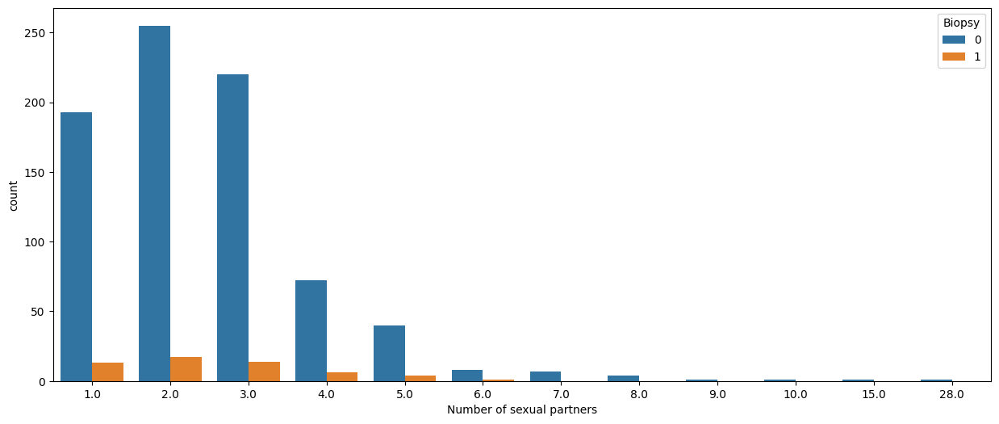

In [19]:
plt.figure(figsize=(15, 6))
sns.countplot(x=cancer_df['Number of sexual partners'],
              hue=cancer_df['Biopsy'])

<Axes: xlabel='First sexual intercourse', ylabel='count'>

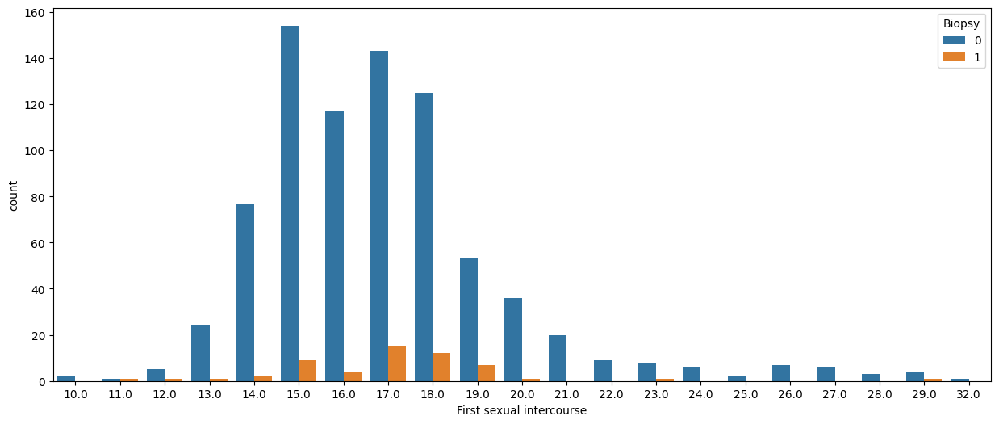

In [20]:
plt.figure(figsize=(15, 6))
sns.countplot(x=cancer_df['First sexual intercourse'],
              hue=cancer_df['Biopsy'])

<Axes: xlabel='Num of pregnancies', ylabel='count'>

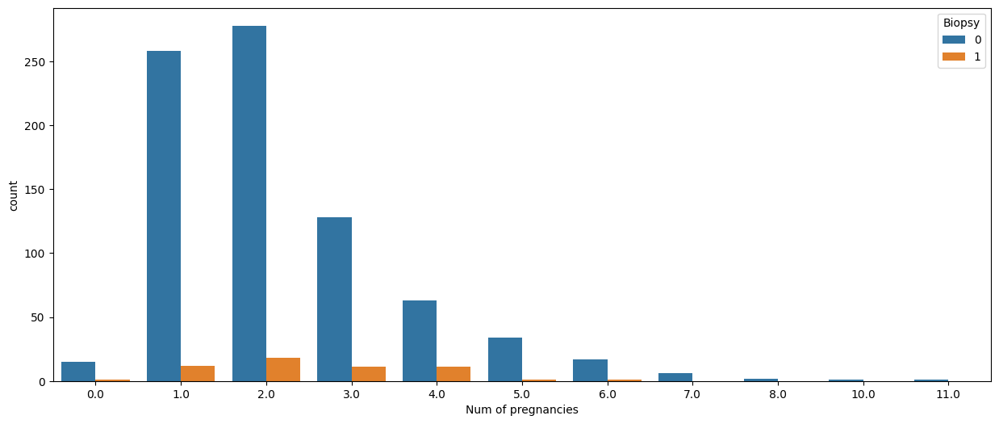

In [21]:
plt.figure(figsize=(15, 6))
sns.countplot(x=cancer_df['Num of pregnancies'],
              hue=cancer_df['Biopsy'])

<Axes: xlabel='Smokes', ylabel='count'>

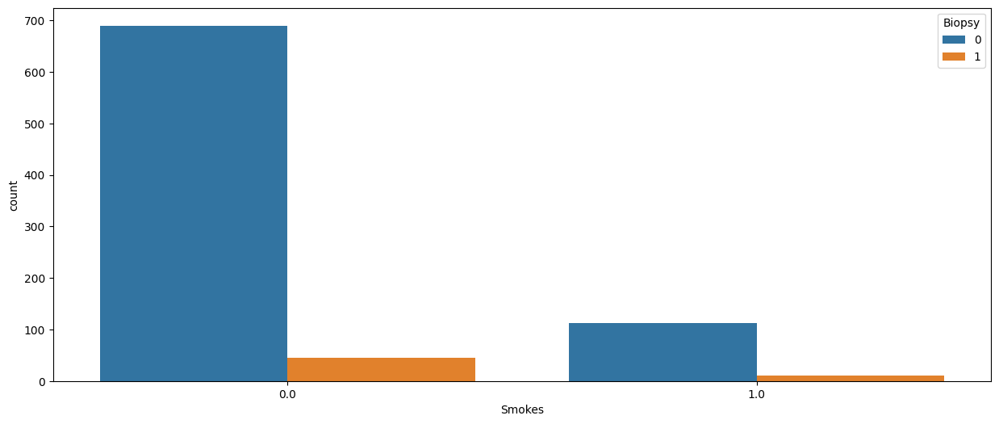

In [22]:
plt.figure(figsize=(15, 6))
sns.countplot(x=cancer_df['Smokes'],
              hue=cancer_df['Biopsy'])

<Axes: xlabel='Hormonal Contraceptives', ylabel='count'>

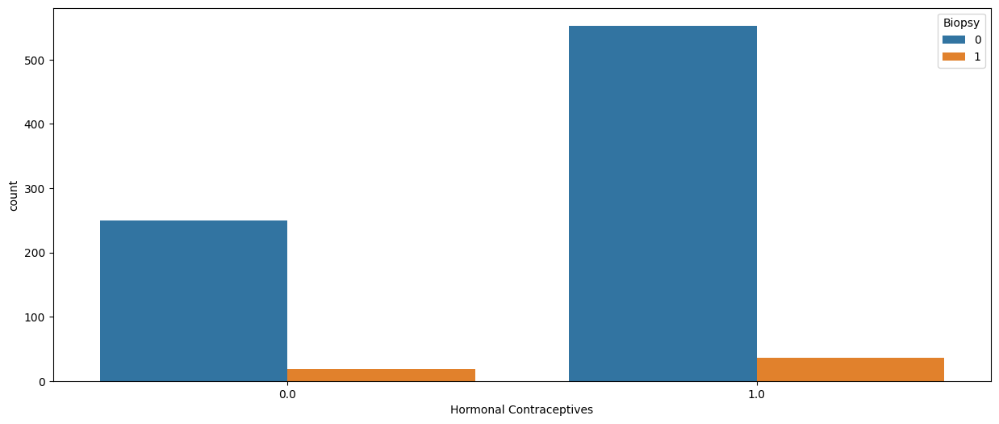

In [23]:
plt.figure(figsize=(15, 6))
sns.countplot(x=cancer_df['Hormonal Contraceptives'],
              hue=cancer_df['Biopsy'])

<Axes: xlabel='IUD', ylabel='count'>

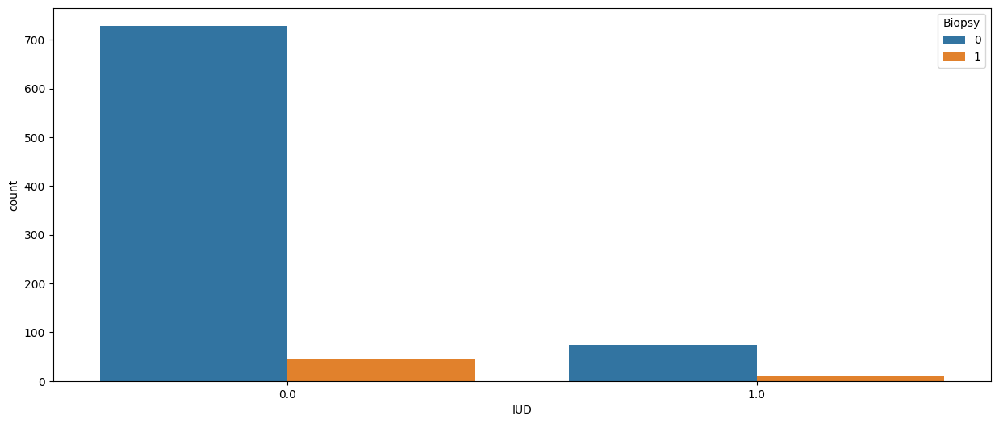

In [24]:
plt.figure(figsize=(15, 6))
sns.countplot(x=cancer_df['IUD'],
              hue=cancer_df['Biopsy'])

<Axes: xlabel='STDs', ylabel='count'>

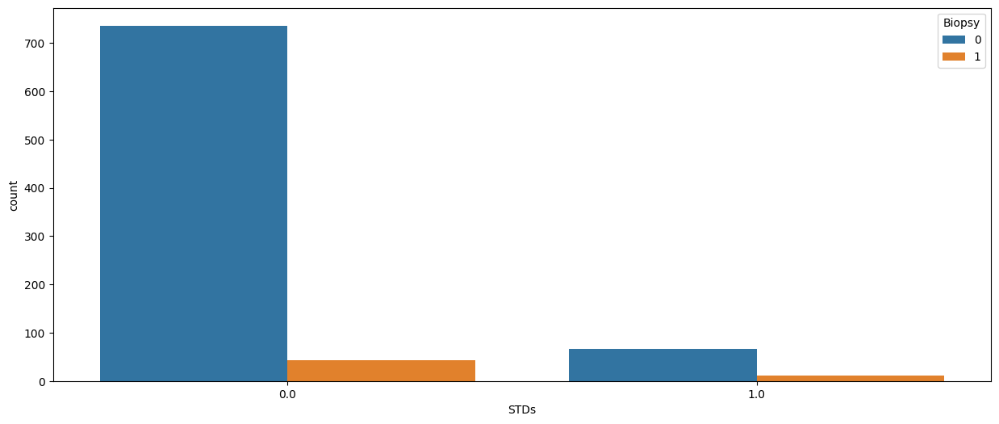

In [25]:
plt.figure(figsize=(15, 6))
sns.countplot(x=cancer_df['STDs'],
              hue=cancer_df['Biopsy'])

<Axes: xlabel='STDs (number)', ylabel='count'>

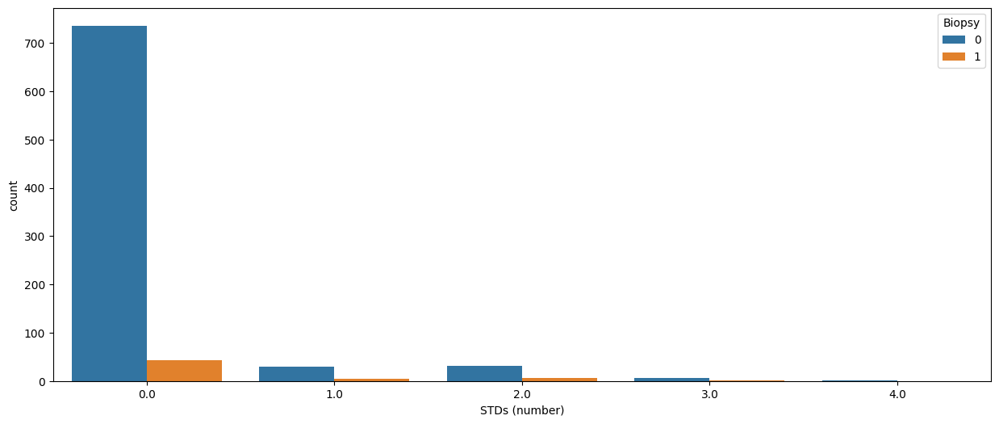

In [26]:
plt.figure(figsize=(15, 6))
sns.countplot(x=cancer_df['STDs (number)'],
              hue=cancer_df['Biopsy'])

<Axes: xlabel='STDs: Number of diagnosis', ylabel='count'>

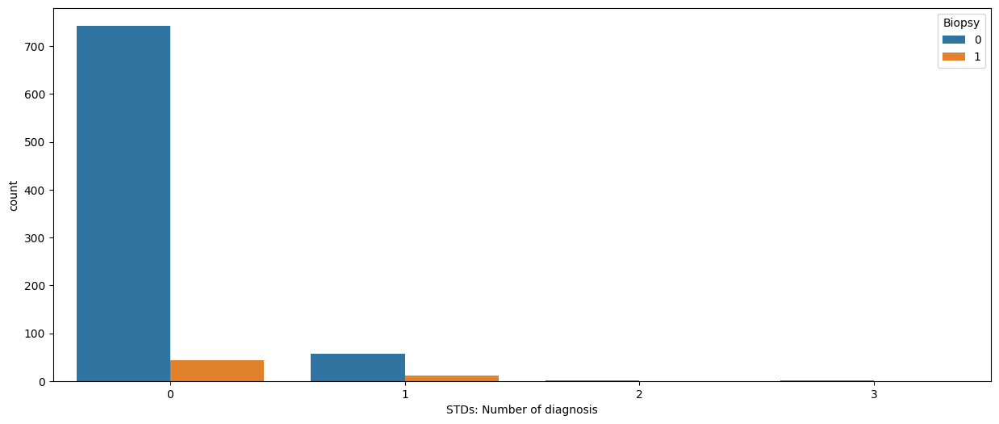

In [27]:
plt.figure(figsize=(15, 6))
sns.countplot(x=cancer_df['STDs: Number of diagnosis'],
              hue=cancer_df['Biopsy'])

# Train H2O AutoML

In [28]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.25" 2024-10-15; OpenJDK Runtime Environment (build 11.0.25+9-post-Ubuntu-1ubuntu122.04); OpenJDK 64-Bit Server VM (build 11.0.25+9-post-Ubuntu-1ubuntu122.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp9p300pb1
  JVM stdout: /tmp/tmp9p300pb1/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp9p300pb1/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.6
H2O_cluster_version_age:,27 days
H2O_cluster_name:,H2O_from_python_unknownUser_xz4ht3
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [29]:
#convert pandas df into h2o frame
h2o_df = h2o.H2OFrame(cancer_df)

#preview
h2o_df

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,IUD (years),STDs,STDs (number),STDs:condylomatosis,STDs:cervical condylomatosis,STDs:vaginal condylomatosis,STDs:vulvo-perineal condylomatosis,STDs:syphilis,STDs:pelvic inflammatory disease,STDs:genital herpes,STDs:molluscum contagiosum,STDs:AIDS,STDs:HIV,STDs:Hepatitis B,STDs:HPV,STDs: Number of diagnosis,Dx:CIN,Dx:HPV,Dx,Biopsy
18,4,15,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
15,1,14,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
34,1,17,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
52,5,16,4,1,37,37,1,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
46,3,21,4,0,0,0,1,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
42,3,23,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
51,3,17,6,1,34,3.4,0,0,1,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
26,1,26,3,0,0,0,1,2,1,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
45,1,20,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
44,3,15,2,1,1.26697,2.8,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [30]:
#statistics
h2o_df.describe()

Rows:858
Cols:30

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,IUD (years),STDs,STDs (number),STDs:condylomatosis,STDs:cervical condylomatosis,STDs:vaginal condylomatosis,STDs:vulvo-perineal condylomatosis,STDs:syphilis,STDs:pelvic inflammatory disease,STDs:genital herpes,STDs:molluscum contagiosum,STDs:AIDS,STDs:HIV,STDs:Hepatitis B,STDs:HPV,STDs: Number of diagnosis,Dx:CIN,Dx:HPV,Dx,Biopsy
type,int,int,int,int,int,real,real,int,real,int,real,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int
mins,13.0,1.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,26.82051282051281,2.5419580419580448,16.995337995337973,2.257575757575757,0.14335664335664336,1.2163923002738926,0.4462781332151514,0.6864801864801865,2.2241426585571125,0.09673659673659674,0.5809673659673666,0.09207459207459208,0.155011655011655,0.05128205128205128,0.0,0.004662004662004662,0.05011655011655012,0.02097902097902098,0.0011655011655011655,0.0011655011655011655,0.0011655011655011655,0.0,0.02097902097902098,0.0011655011655011655,0.002331002331002331,0.08741258741258745,0.01048951048951049,0.02097902097902098,0.027972027972027972,0.0641025641025641
maxs,84.0,28.0,32.0,11.0,1.0,37.0,37.0,1.0,30.0,1.0,19.0,1.0,4.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,3.0,1.0,1.0,1.0,1.0
sigma,8.497948065482602,1.6442642822073092,2.7918829988184384,1.400981385307712,0.3506405754432586,4.057973744319563,2.210351363826228,0.46419422433217444,3.520110769369973,0.2957711722154902,1.8132555149585823,0.28929985741160474,0.5296169438520896,0.22070109393249174,0.0,0.06815926148170622,0.21831268815040117,0.1433975861165658,0.03413943709994594,0.03413943709994594,0.03413943709994594,0.0,0.1433975861165658,0.03413943709994594,0.04825227844316598,0.3025447418507477,0.1019391586774784,0.1433975861165658,0.1649888484215437,0.24507841474716066
zeros,0,0,0,16,735,722,735,269,269,775,658,779,779,814,858,854,815,840,857,857,857,858,840,857,856,787,849,840,834,803
missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,18.0,4.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,15.0,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,34.0,1.0,17.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [31]:
#split train and test sets
train, test = h2o_df.split_frame(ratios=[0.75], seed=121)

In [32]:
#define X and y
X = train.columns
y = 'Biopsy'
X.remove(y)

In [33]:
#for binary classification, response should be a factor
train[y] = train[y].asfactor()
test[y] = test[y].asfactor()

In [34]:
X

['Age',
 'Number of sexual partners',
 'First sexual intercourse',
 'Num of pregnancies',
 'Smokes',
 'Smokes (years)',
 'Smokes (packs/year)',
 'Hormonal Contraceptives',
 'Hormonal Contraceptives (years)',
 'IUD',
 'IUD (years)',
 'STDs',
 'STDs (number)',
 'STDs:condylomatosis',
 'STDs:cervical condylomatosis',
 'STDs:vaginal condylomatosis',
 'STDs:vulvo-perineal condylomatosis',
 'STDs:syphilis',
 'STDs:pelvic inflammatory disease',
 'STDs:genital herpes',
 'STDs:molluscum contagiosum',
 'STDs:AIDS',
 'STDs:HIV',
 'STDs:Hepatitis B',
 'STDs:HPV',
 'STDs: Number of diagnosis',
 'Dx:CIN',
 'Dx:HPV',
 'Dx']

In [35]:
y

'Biopsy'

In [36]:
#initiate
aml = H2OAutoML(balance_classes=True,
                stopping_metric='AUC',     #for classification
                seed=121,
                max_models=20,
                exclude_algos = ["StackedEnsemble"])

#train
aml.train(x=X,
          y=y,
          training_frame=train)

AutoML progress: |
23:57:49.851: _train param, Dropping bad and constant columns: [STDs:cervical condylomatosis, STDs:AIDS]

██
23:57:59.111: _train param, Dropping bad and constant columns: [STDs:cervical condylomatosis, STDs:AIDS]


23:58:01.954: _train param, Dropping bad and constant columns: [STDs:cervical condylomatosis, STDs:AIDS]

██
23:58:08.805: _train param, Dropping bad and constant columns: [STDs:cervical condylomatosis, STDs:AIDS]

█
23:58:12.857: _train param, Dropping bad and constant columns: [STDs:cervical condylomatosis, STDs:AIDS]

██
23:58:19.26: _train param, Dropping bad and constant columns: [STDs:cervical condylomatosis, STDs:AIDS]

█
23:58:23.521: _train param, Dropping bad and constant columns: [STDs:cervical condylomatosis, STDs:AIDS]

█
23:58:26.779: _train param, Dropping bad and constant columns: [STDs:cervical condylomatosis, STDs:AIDS]

█
23:58:30.234: _train param, Dropping bad and constant columns: [STDs:cervical condylomatosis, STDs:AIDS]

██
23:58:3

Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_grid_1_AutoML_1_20241129_235749_model_2


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    28                 28                          7122                   4            7            6.89286       5             26            15.5357

ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.3514331394477726
RMSE: 0.5928179648490526
LogLoss: 0.9650805387374057
Mean Per-Class Error: 0.06919875574697909
AUC: 0.9767115600448933
AUCPR: 0.9729071173686142
Gini: 0.9534231200897867

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.07786014662799876
       0    1    Error    Rate
-----  ---  ---  -------  -------------
0      550  41   0.0694   (41.0/591.0)
1      41   553  0.069    (41.0/594.0)
Total  591  594  0.0692   (82.0/1185.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.0778601    0.930976  78
max f2                       0.0557852    0.967427  130
max f0point5                 0.095213     0.934086  60
max accuracy                 0.0778601    0.930802  78
max precision                0.349683     1         0
max recall                   0.0557852    1         130
max specificity              0.349683     1         0
max absolute_mcc             0.0778601    0.861602  78
max min_per_class_accuracy   0.0778601    0.930626  78
max mean_per_class_accuracy  0.0778601    0.930801  78
max tns                      0.349683     591       0
max fns                      0.349683     580       0
max fps                      0.00377289   591       399
max tps                      0.0557852    594       130
max tnr                      0.349683     1         0
max fnr                      0.349683     0.976431  0
max fpr                      0.00377289   1         399
max tpr                      0.0557852    1         130

Gains/Lift Table: Avg response rate: 50.13 %, avg score: 10.18 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score      cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  ---------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0118143                   0.349683           1.99495   1.99495            1                0.349683   1                           0.349683            0.023569        0.023569                   99.4949   99.4949            0.023569
2        0.0227848                   0.315718           1.99495   1.99495            1                0.315718   1                           0.33333             0.0218855       0.0454545                  99.4949   99.4949            0.0454545
3        0.0337553                   0.311596           1.99495   1.99495            1                0.311596   1                           0.326266            0.0218855       0.0673401                  99.4949   99.4949            0.0673401
4        0.0455696                   0.285744           1.99495   1.99495            1                0.285744   1                           0.31576             0.023569        0.0909091                  99.4949   99.4949            0.0909091
5        0.0565401                   0.282157           1.99495   1.99495            1                0.282157   1                           0.30924       

# Leaderboard Exploration

In [37]:
#leaderboard
lb = aml.leaderboard
lb.head(rows=lb.nrows)

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
GBM_grid_1_AutoML_1_20241129_235749_model_2,0.663994,0.251406,0.12405,0.41186,0.252916,0.0639664
GBM_1_AutoML_1_20241129_235749,0.660975,0.250988,0.106918,0.359983,0.256129,0.0656022
DRF_1_AutoML_1_20241129_235749,0.656764,0.5866,0.140075,0.374481,0.256208,0.0656427
XGBoost_grid_1_AutoML_1_20241129_235749_model_1,0.646708,0.324942,0.144509,0.386229,0.288655,0.0833218
GBM_3_AutoML_1_20241129_235749,0.64467,0.304093,0.138457,0.40811,0.255585,0.0653239
XGBoost_grid_1_AutoML_1_20241129_235749_model_3,0.630288,0.429127,0.102927,0.383076,0.364703,0.133009
GBM_2_AutoML_1_20241129_235749,0.62873,0.27968,0.170272,0.402553,0.252526,0.0637691
XGBoost_3_AutoML_1_20241129_235749,0.627096,0.344856,0.123758,0.388767,0.309132,0.0955623
DeepLearning_grid_3_AutoML_1_20241129_235749_model_1,0.626307,0.517243,0.0981158,0.383422,0.30409,0.0924707
XGBoost_2_AutoML_1_20241129_235749,0.616347,0.36999,0.105149,0.425761,0.330871,0.109475


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
DeepLearning_grid_3_AutoML_1_20241129_235749_model_1,0.809177,0.28003,0.174675,0.375429,0.250628,0.0628143,42650,0.090333,DeepLearning
GBM_grid_1_AutoML_1_20241129_235749_model_2,0.794597,0.170055,0.224321,0.312822,0.209282,0.0437988,242,0.029405,GBM
GLM_1_AutoML_1_20241129_235749,0.786878,0.182471,0.18477,0.375429,0.210777,0.044427,129,0.027058,GLM
GBM_4_AutoML_1_20241129_235749,0.763293,0.197501,0.228477,0.411449,0.213402,0.0455406,392,0.038604,GBM
XGBoost_grid_1_AutoML_1_20241129_235749_model_2,0.752144,0.192427,0.164782,0.351201,0.215073,0.0462562,633,0.02072,XGBoost
DRF_1_AutoML_1_20241129_235749,0.741424,0.20837,0.116277,0.360635,0.21699,0.0470845,707,0.091755,DRF
XGBoost_grid_1_AutoML_1_20241129_235749_model_1,0.728988,0.236021,0.144095,0.413808,0.256556,0.0658212,719,0.03219,XGBoost
DeepLearning_grid_1_AutoML_1_20241129_235749_model_1,0.725129,0.34354,0.240374,0.375429,0.272007,0.0739875,27221,0.034531,DeepLearning
XRT_1_AutoML_1_20241129_235749,0.717839,0.187693,0.23557,0.301029,0.214389,0.0459624,379,0.031042,DRF
GBM_3_AutoML_1_20241129_235749,0.70283,0.214266,0.103573,0.296741,0.217332,0.0472333,470,0.039435,GBM


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## GBM_grid_1_AutoML_1_20241129_235749_model_2

,0,1,Error,Rate
0,195.0,17.0,0.0802,(17.0/212.0)
1,6.0,5.0,0.5455,(6.0/11.0)
Total,201.0,22.0,0.1031,(23.0/223.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

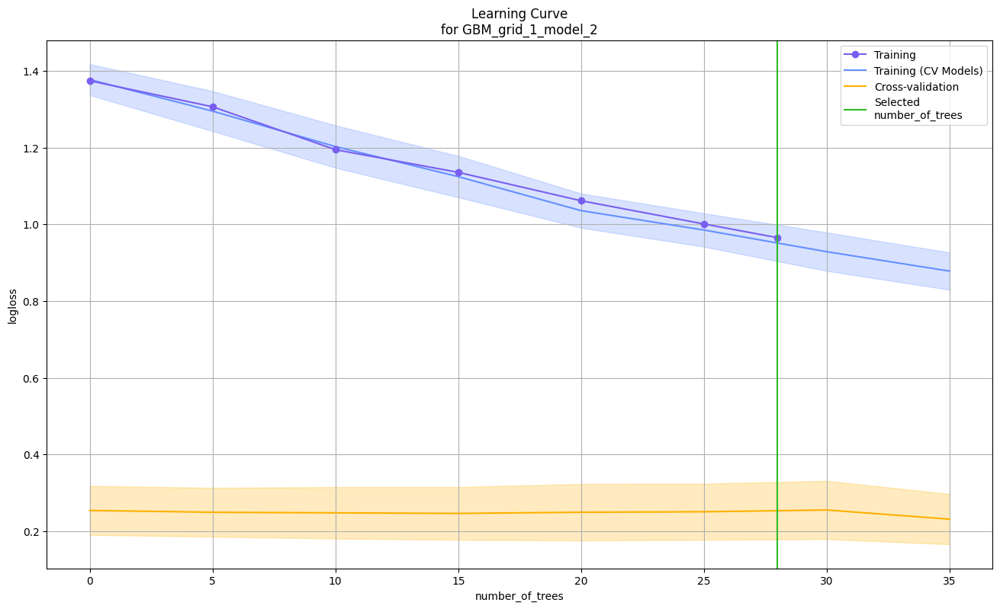

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

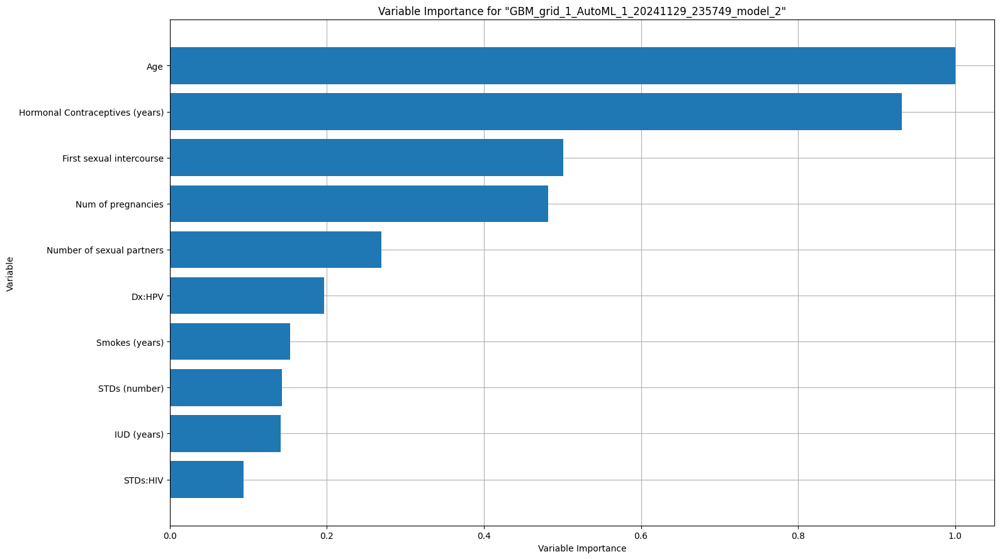

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

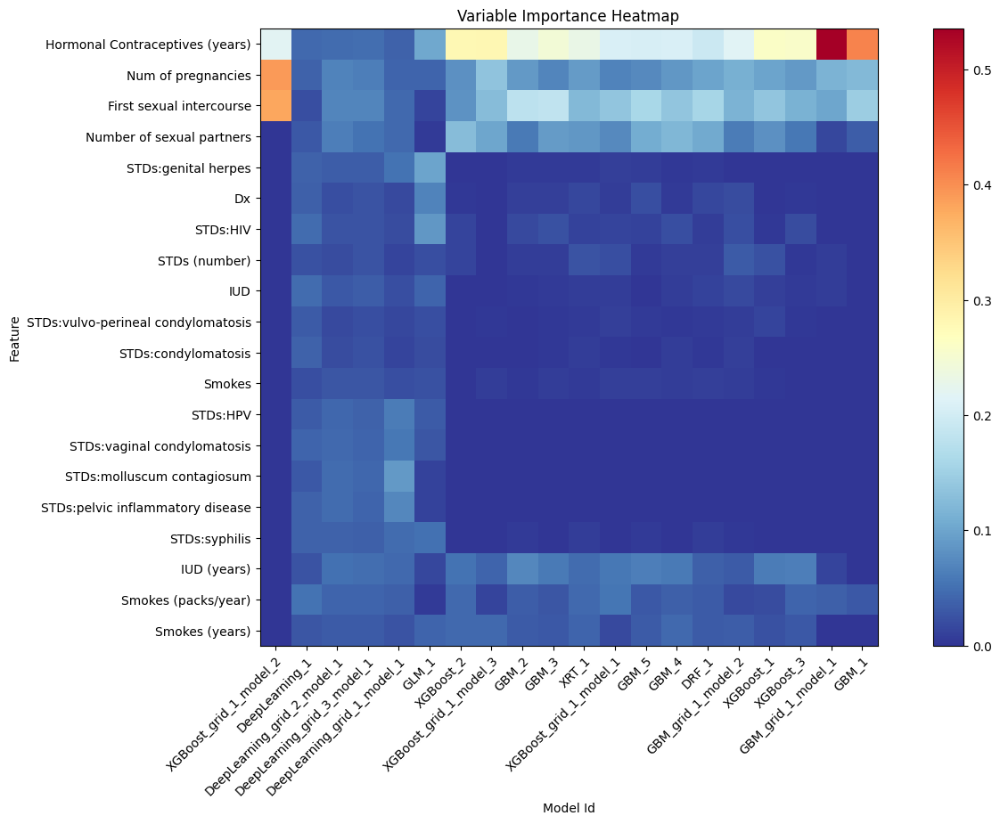

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

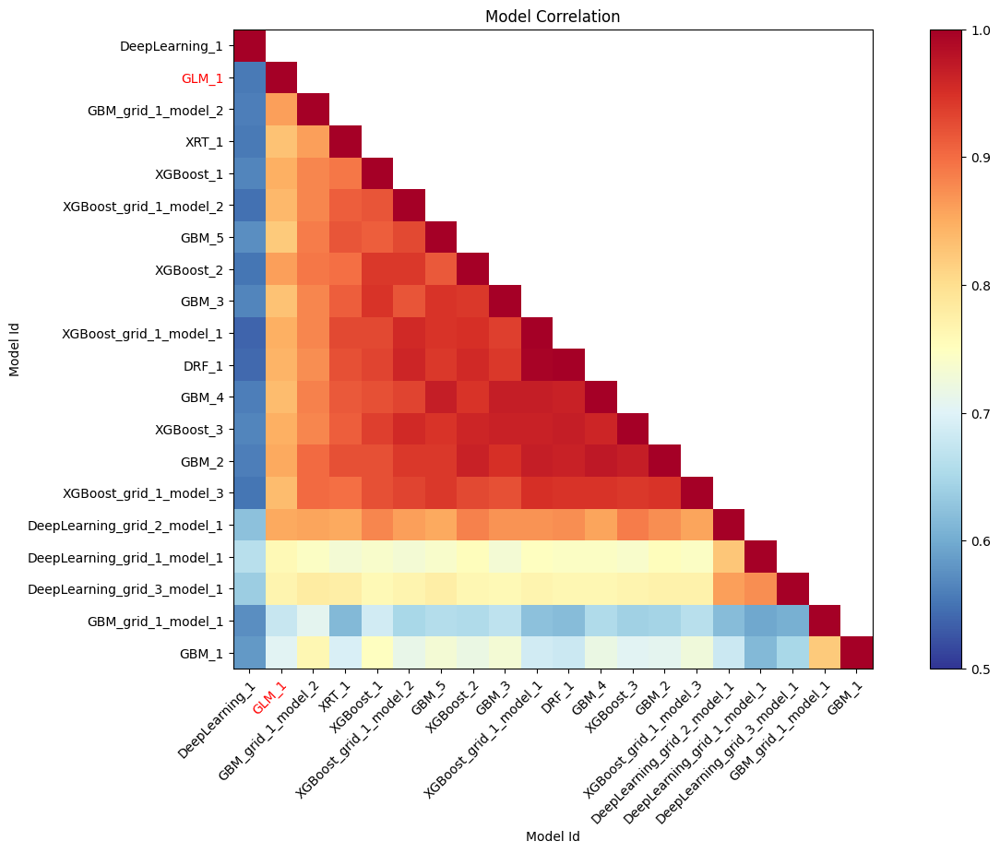

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

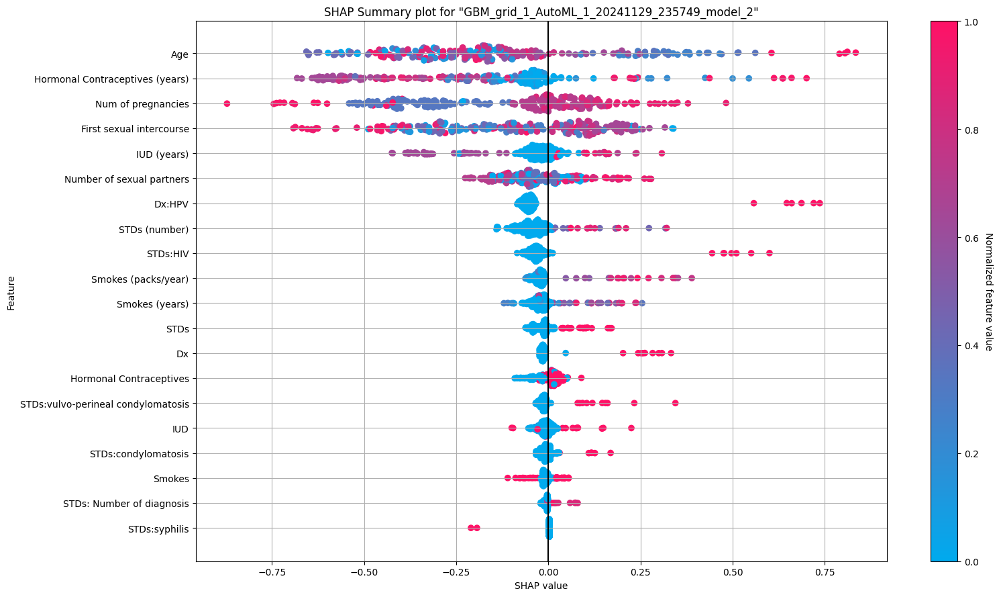

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

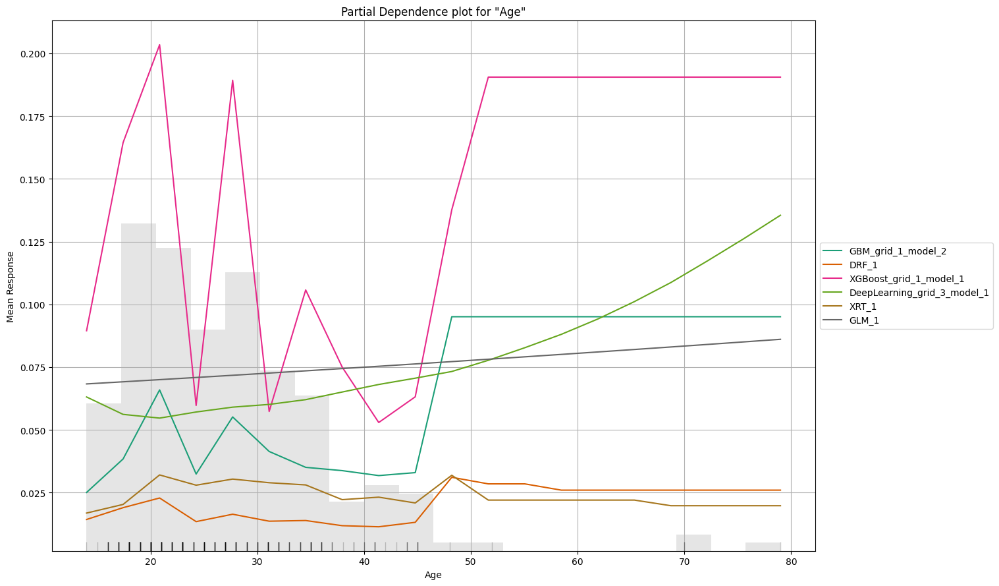

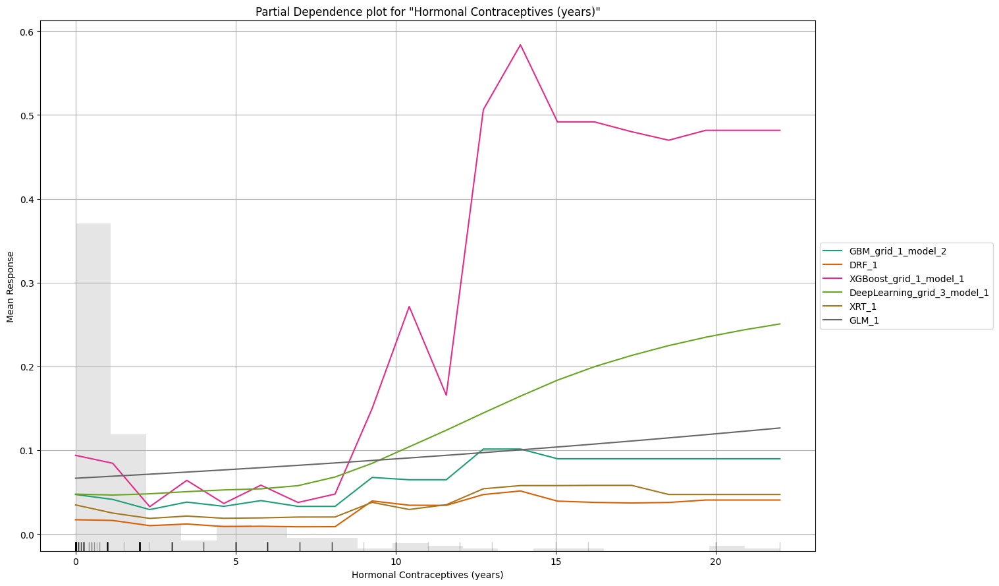

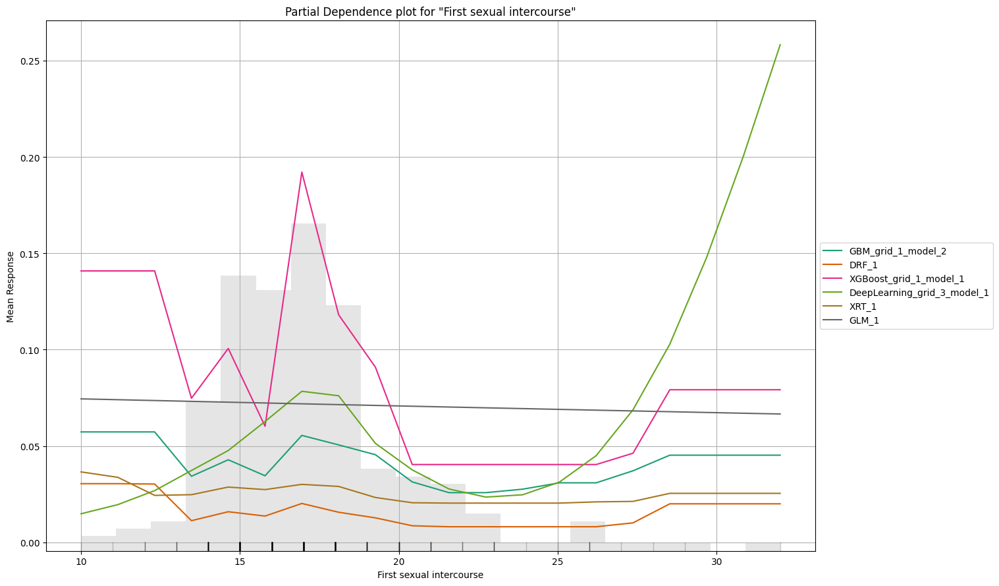

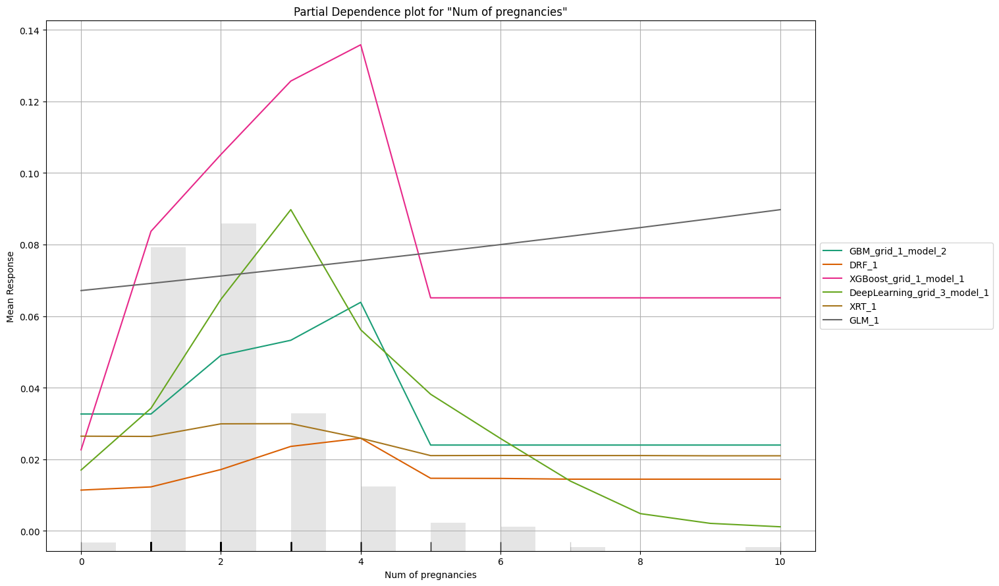

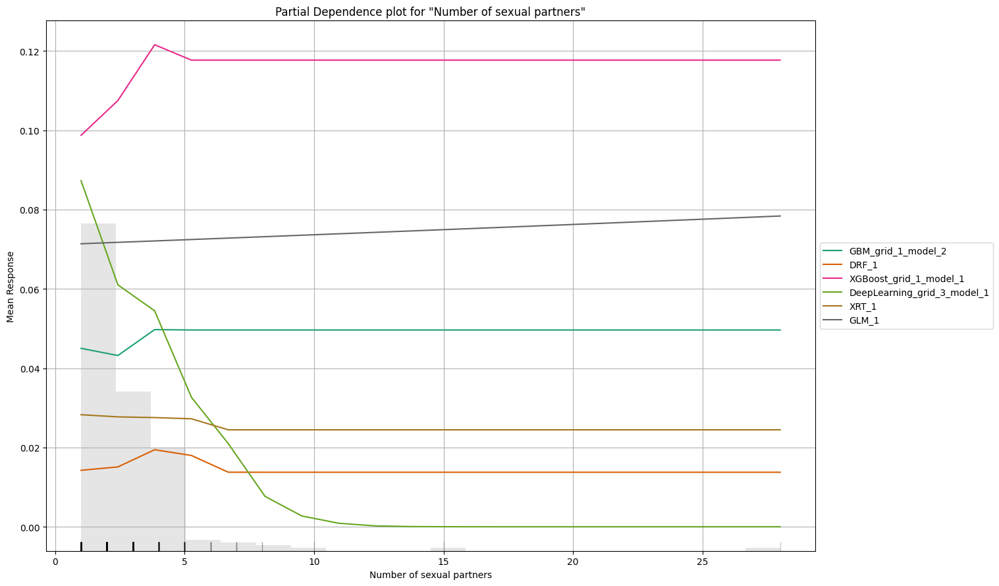

In [38]:
#compare all models
exm = aml.explain(test)

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## GBM_grid_1_AutoML_1_20241129_235749_model_2

,0,1,Error,Rate
0,195.0,17.0,0.0802,(17.0/212.0)
1,6.0,5.0,0.5455,(6.0/11.0)
Total,201.0,22.0,0.1031,(23.0/223.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

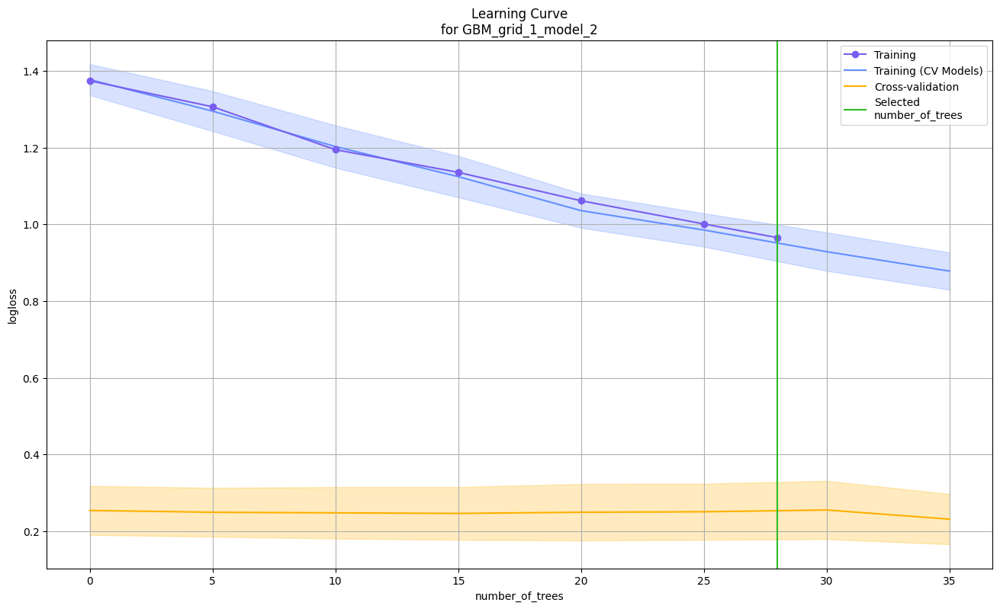

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

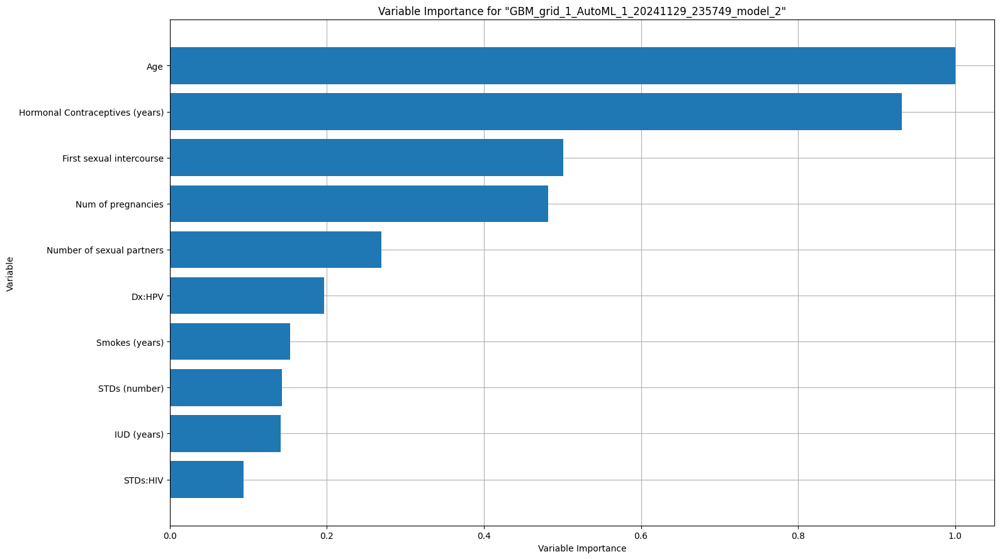

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

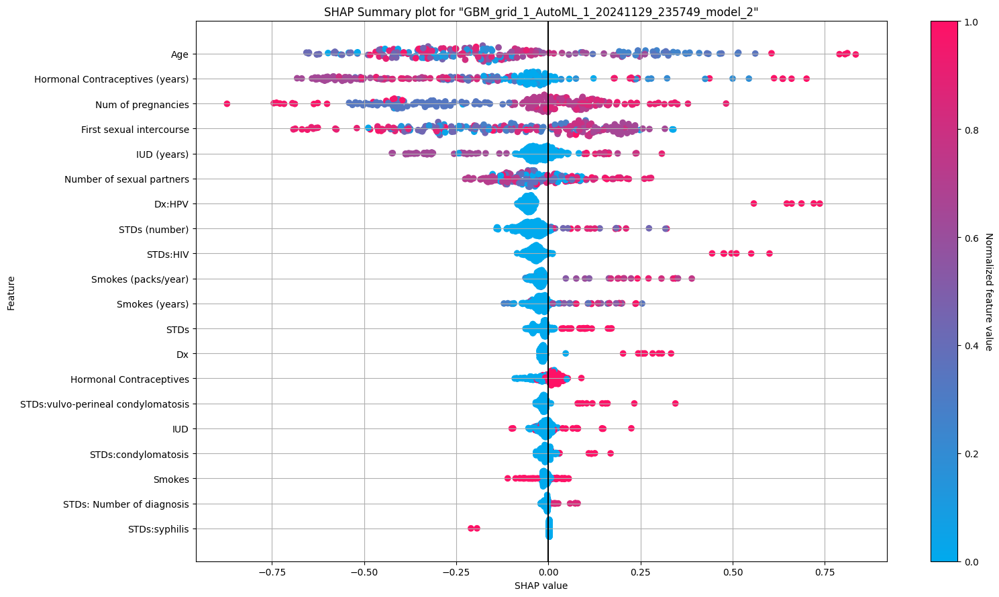

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

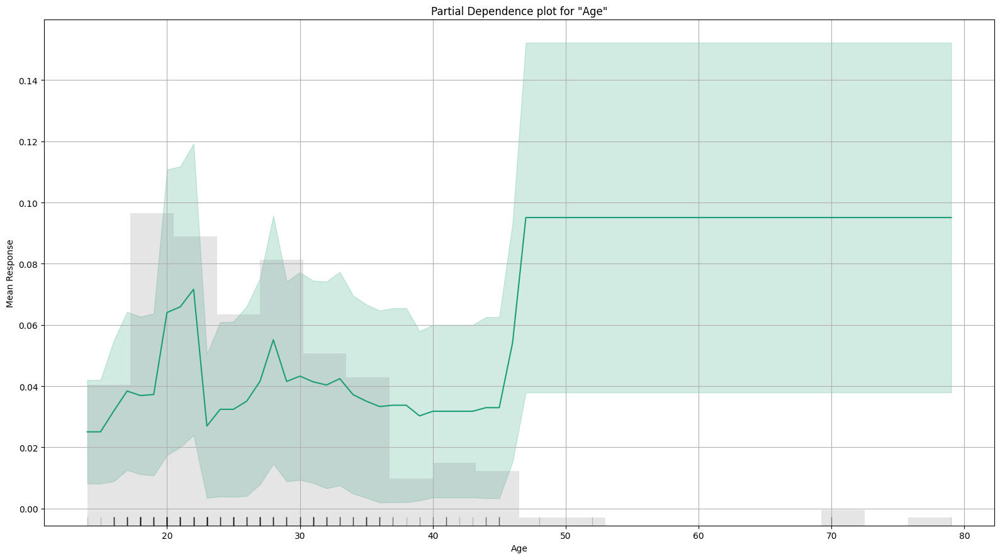

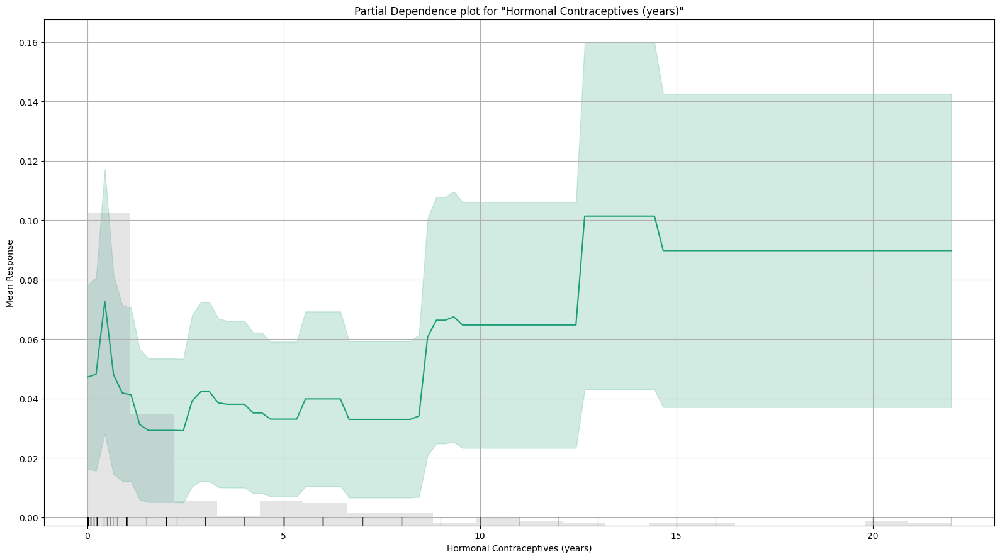

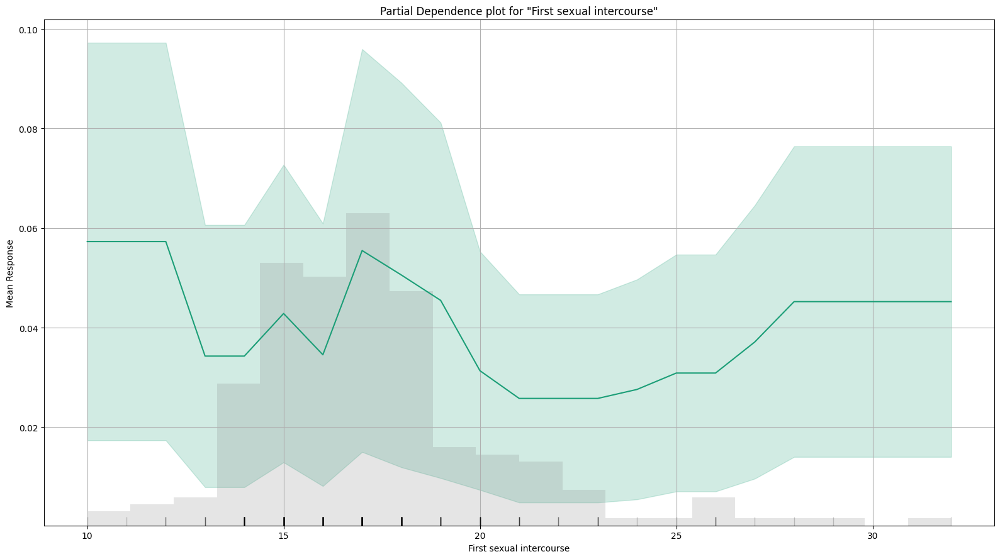

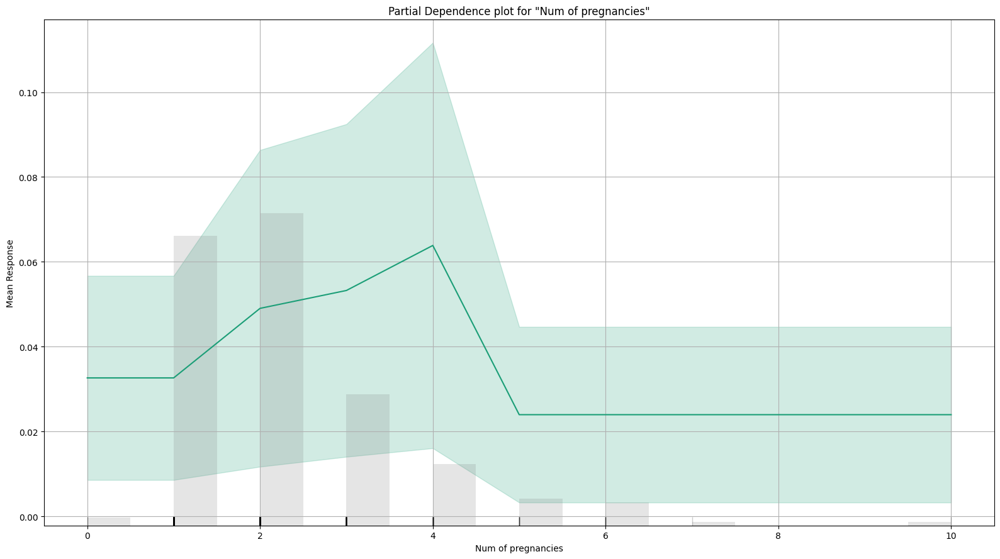

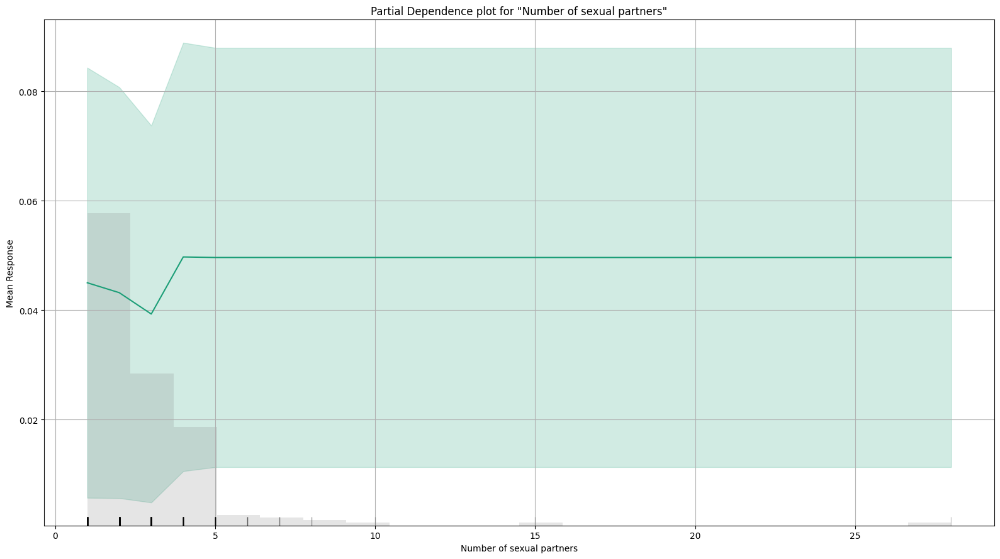

In [39]:
#explain a single H2O model (e.g. leader model from AutoML)
exm = aml.leader.explain(test)

In [40]:
#make prediction
preds = aml.leader.predict(test)

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [41]:
#combine the prediction with the test dataset
df = test.cbind(preds)

#preview
df

Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,IUD (years),STDs,STDs (number),STDs:condylomatosis,STDs:cervical condylomatosis,STDs:vaginal condylomatosis,STDs:vulvo-perineal condylomatosis,STDs:syphilis,STDs:pelvic inflammatory disease,STDs:genital herpes,STDs:molluscum contagiosum,STDs:AIDS,STDs:HIV,STDs:Hepatitis B,STDs:HPV,STDs: Number of diagnosis,Dx:CIN,Dx:HPV,Dx,Biopsy,predict,p0,p1
15,1,14,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.988012,0.0119877
42,3,23,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.989945,0.0100546
44,3,26,4,0,0,0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.984469,0.0155307
27,1,17,3,0,0,0,1,8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.962496,0.0375038
45,4,14,6,0,0,0,1,10,1,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.969774,0.0302262
41,4,21,3,0,0,0,1,0.25,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.976563,0.0234366
37,6,26,1,0,0,0,1,0.25,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.986325,0.0136754
41,3,17,3,0,0,0,1,22,1,0.58,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.904566,0.0954336
36,2,20,3,0,0,0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.980794,0.0192061
37,2,18,2,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,1,1,0.878592,0.121408


In [42]:
df = h2o.as_list(df)

/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


In [43]:
preds = df[['Biopsy', 'predict']]
preds

,Biopsy,predict
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
218,0,0
219,0,0
220,0,1
221,0,0


In [44]:
df.to_csv('df.csv')
preds.to_csv('preds.csv')

# Use LIME to explain H2O Models

In [45]:
!pip install lime
import lime
import lime.lime_tabular

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 10.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=f7fe8eb003df26617160ff9c2a78183a81d21f2dcde82ec30d40b6b01ec24cbe
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [46]:
feature_names = train.columns[0: -1]
feature_names

['Age',
 'Number of sexual partners',
 'First sexual intercourse',
 'Num of pregnancies',
 'Smokes',
 'Smokes (years)',
 'Smokes (packs/year)',
 'Hormonal Contraceptives',
 'Hormonal Contraceptives (years)',
 'IUD',
 'IUD (years)',
 'STDs',
 'STDs (number)',
 'STDs:condylomatosis',
 'STDs:cervical condylomatosis',
 'STDs:vaginal condylomatosis',
 'STDs:vulvo-perineal condylomatosis',
 'STDs:syphilis',
 'STDs:pelvic inflammatory disease',
 'STDs:genital herpes',
 'STDs:molluscum contagiosum',
 'STDs:AIDS',
 'STDs:HIV',
 'STDs:Hepatitis B',
 'STDs:HPV',
 'STDs: Number of diagnosis',
 'Dx:CIN',
 'Dx:HPV',
 'Dx']

In [47]:
train_features_numpy = train[feature_names].as_data_frame().values
train_features_numpy

/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


array([[18.,  4., 15., ...,  0.,  0.,  0.],
       [34.,  1., 17., ...,  0.,  0.,  0.],
       [52.,  5., 16., ...,  0.,  1.,  0.],
       ...,
       [25.,  2., 17., ...,  0.,  0.,  0.],
       [33.,  2., 24., ...,  0.,  0.,  0.],
       [29.,  2., 20., ...,  0.,  0.,  0.]])

In [48]:
#define LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(train_features_numpy,
                                                   feature_names = feature_names,
                                                   mode='classification')

In [49]:
#https://sefiks.com/2019/09/19/explaining-h2o-models-with-lime/

def findPrediction(instance):
    #instance will be in type of numpy
    df = pd.DataFrame(data = instance, columns = feature_names)
    hf = h2o.H2OFrame(df)
    predictions = aml.leader.predict(hf).as_data_frame()

    #here predictions object is 3 columned data frame. 1st column is class prediction and others are probabilities
    #lime needs just prediction probabilities

    predictions = predictions.iloc[:,1:].values
    return predictions

In [50]:
idx = 100
test_df = test.as_data_frame()
test_numpy = test_df.iloc[idx].values[0:-1]

/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


In [51]:
test_numpy

array([45.,  2., 18.,  4.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.])

In [52]:
exp = explainer.explain_instance(test_numpy,
                                 findPrediction,
                                 num_features = len(feature_names))
exp

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


In [53]:
exp.show_in_notebook(show_table=True, show_all=True)

In [54]:
exp.save_to_file('lime.html')

In [55]:
idx = 120
test_df = test.as_data_frame()
test_numpy = test_df.iloc[idx].values[0:-1]

exp = explainer.explain_instance(test_numpy,
                                 findPrediction,
                                 num_features = len(feature_names))

exp.show_in_notebook(show_table=True, show_all=True)

/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


In [56]:
exp.save_to_file('lime1.html')

In [57]:
idx = 150
test_df = test.as_data_frame()
test_numpy = test_df.iloc[idx].values[0:-1]

exp = explainer.explain_instance(test_numpy,
                                 findPrediction,
                                 num_features = len(feature_names))

exp.show_in_notebook(show_table=True, show_all=True)

/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


In [58]:
exp.save_to_file('lime2.html')